<a href="https://colab.research.google.com/github/RozhinMalekiTehrani/CONN-toolbox---fMRI-data-analysis/blob/main/Latching_project_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# for your info:

# the location of data on cluster:
# scripts/ data/ nim_fmri_nemo__/ sub_0001/ net_series_t0_1.txt >>> run1 with threshold of 0



# 1:21 latchers

# remained people are explorers

# Packages loading

In [1]:
import numpy as np
import itertools
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression

import pylab
import random


# !pip install networkx
import numpy as np
import networkx as nx

import matplotlib.pyplot as plt

import seaborn as sns


# Data uploading

In [2]:
# from google.colab import drive
# # drive.mount('/content/drive')
# drive.mount("/content/drive", force_remount=True)



#FOR COLAB:
import pandas as pd
import numpy as np
import scipy.io as sio
from google.colab import files


uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(  name=fn, length=len(uploaded[fn])))

Saving tmeanrun_1_networks_concat.csv to tmeanrun_1_networks_concat.csv
User uploaded file "tmeanrun_1_networks_concat.csv" with length 190510 bytes


In [3]:

df = pd.read_csv('tmeanrun_1_networks_concat.csv')#"t0_1_networks_concat.csv")  t0_4_networks_concat.csv
# df
DATA_LATCHERS = df[df['Type']=='Latchers']
DATA_LATCHERS = DATA_LATCHERS.iloc[:, [1,2,3,4,5,6,7,8]]
DATA_LATCHERS
DATA_LATCHERS = DATA_LATCHERS.reset_index().drop(['index'],axis=1).copy()






DATA_EXPLORERS = df[df['Type']=='Explorers']
DATA_EXPLORERS = DATA_EXPLORERS.iloc[:, [1,2,3,4,5,6,7,8]]
DATA_EXPLORERS
DATA_EXPLORERS = DATA_EXPLORERS.reset_index().drop(['index'],axis=1).copy()


# # df = pd.read_csv("Explorers_rest1.csv")

df = df.iloc[:, [1,2,3,4,5,6,7,8]]

df

,0,1,2,3,4,5,6,7
0,1,1,0,1,1,0,1,0
1,1,1,1,1,0,0,1,1
2,1,1,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,1,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...
5775,0,1,0,0,1,1,1,0
5776,1,1,0,0,1,1,0,0
5777,1,0,1,1,1,0,1,1
5778,0,0,1,1,1,0,0,1


In [4]:
DATA_EXPLORERS

,0,1,2,3,4,5,6,7
0,1,1,1,1,1,0,1,0
1,0,1,0,1,0,1,1,1
2,0,0,1,1,0,1,1,0
3,1,1,0,0,0,1,1,0
4,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...
2375,0,1,0,0,1,1,1,0
2376,1,1,0,0,1,1,0,0
2377,1,0,1,1,1,0,1,1
2378,0,0,1,1,1,0,0,1


In [5]:
DATA_LATCHERS

,0,1,2,3,4,5,6,7
0,1,1,0,1,1,0,1,0
1,1,1,1,1,0,0,1,1
2,1,1,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,1,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...
3395,0,1,0,0,0,1,0,0
3396,1,1,0,0,0,0,0,0
3397,1,1,0,0,1,0,0,0
3398,0,0,0,0,1,0,0,0


In [6]:
df

,0,1,2,3,4,5,6,7
0,1,1,0,1,1,0,1,0
1,1,1,1,1,0,0,1,1
2,1,1,0,0,0,0,1,0
3,0,1,1,0,1,0,0,0
4,1,1,1,1,0,0,0,1
...,...,...,...,...,...,...,...,...
5775,0,1,0,0,1,1,1,0
5776,1,1,0,0,1,1,0,0
5777,1,0,1,1,1,0,1,1
5778,0,0,1,1,1,0,0,1


In [7]:
data_p = df.T
data_p

,0,1,2,3,4,5,6,7,8,9,...,5770,5771,5772,5773,5774,5775,5776,5777,5778,5779
0,1,1,1,0,1,1,1,1,0,0,...,0,1,0,0,1,0,1,1,0,1
1,1,1,1,1,1,1,1,1,0,0,...,1,1,1,1,1,1,1,0,0,0
2,0,1,0,1,1,1,1,1,0,0,...,1,1,0,0,0,0,0,1,1,0
3,1,1,0,0,1,0,1,1,0,0,...,1,0,0,1,1,0,0,1,1,0
4,1,0,0,1,0,1,0,0,0,0,...,1,1,0,1,1,1,1,1,1,0
5,0,0,0,0,0,0,0,1,1,0,...,0,1,0,1,1,1,1,0,0,0
6,1,1,1,0,0,0,0,1,0,0,...,0,0,1,1,1,1,0,1,0,0
7,0,1,0,0,1,1,1,1,0,0,...,0,0,0,0,1,0,0,1,1,0


In [8]:
data_p = np.array(data_p)
np.shape(data_p)
l_t = len(data_p.T)
ROI = 8
np.shape(data_p) #format of data must be ROI*t


(8, 5780)

In [9]:
data = data_p.T
data

array([[1, 1, 0, ..., 0, 1, 0],
       [1, 1, 1, ..., 0, 1, 1],
       [1, 1, 0, ..., 0, 1, 0],
       ...,
       [1, 0, 1, ..., 0, 1, 1],
       [0, 0, 1, ..., 0, 0, 1],
       [1, 0, 0, ..., 0, 0, 0]])

# H,J estimation

In [10]:
'you can change the eps, alpha and beta inside the function.'

def HandJ(data_p, ROI, l_t):

  #parameters
  expected_value = np.zeros(ROI)
  correlation_value = np.zeros((ROI,ROI))
  for i in range(ROI):
    expected_value[i] = np.sum(data_p[i])/l_t #mean for a specific ROI over time, also it is y data
    for j in range(ROI):
      correlation_value[i][j] = np.dot(data_p[i], data_p[j])/l_t


  eps = 0.00000001  # 0.000001
  e = 1e-10  #1e-8
  #learning rate
  alpha = 0.1
  beta = alpha

  #initial data
  H_rand = np.array([1,1,1,1,1,1,1,1]) *0.1
  J_rand = np.ones((ROI,ROI)) *0.1
  np.fill_diagonal(J_rand, 0)

  #all possible pattern
  sigma = [0,1]
  V = np.array(list(itertools.product(sigma, repeat = ROI))) #(2^ROI, ROI)

  E_rand = -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))
  P_rand = np.exp(-E_rand)/np.sum(np.exp(-E_rand))

  model_expected = np.dot(V.T,P_rand)
  model_corrolation = np.dot(P_rand * V.T, V)
  i = 0
  H_rand_old = np.copy(H_rand)

  #initial condition for starting the while loop.
  cond6 = 100
  cond7 = 100


  while cond6 > eps and  cond7 > eps:
    H_rand_old = np.copy(H_rand)
    J_rand_old = np.copy(J_rand)

    H_rand += alpha * np.log((expected_value / (model_expected + e)))
    J_rand += beta * np.log((correlation_value / (model_corrolation + e)))

    E_rand = -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))
    P_rand = np.exp(-E_rand)/np.sum(np.exp(-E_rand))
    model_expected = np.dot(V.T,P_rand)
    model_corrolation = np.dot(P_rand * V.T, V)

    cond4 = np.sum(abs(alpha  * np.log(((model_expected+e)/(expected_value)))))/8
    cond6 = np.sum(abs((H_rand-H_rand_old)))/8
    cond7 = np.sum(abs(J_rand-J_rand_old))/64
  return H_rand, J_rand

In [11]:
data_p.shape

(8, 5780)

In [12]:




H_rand, J_rand = HandJ(np.array(data_p), ROI, l_t)



H_latcher, J_latcher = HandJ(np.array(DATA_LATCHERS.T), ROI, l_t)


H_explorers, J_explorers = HandJ(np.array(DATA_EXPLORERS.T), ROI, l_t)




h_vec= HandJ(data_p, ROI, l_t)[0] # np.array([0,1,0]) ##### call fatemeh's function
J_mat = HandJ(data_p, ROI, l_t)[1]

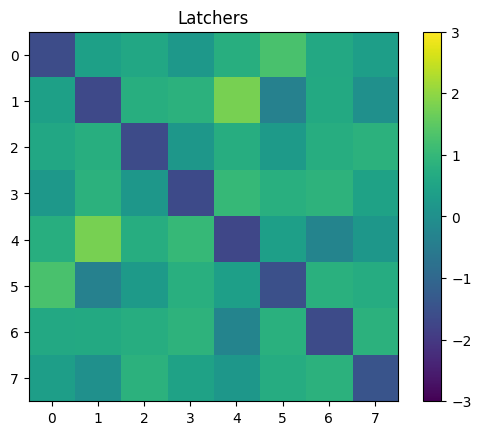

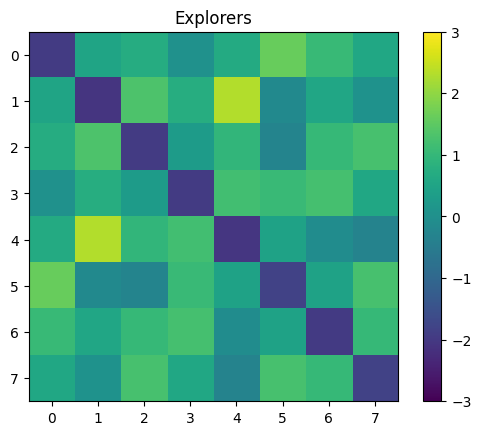

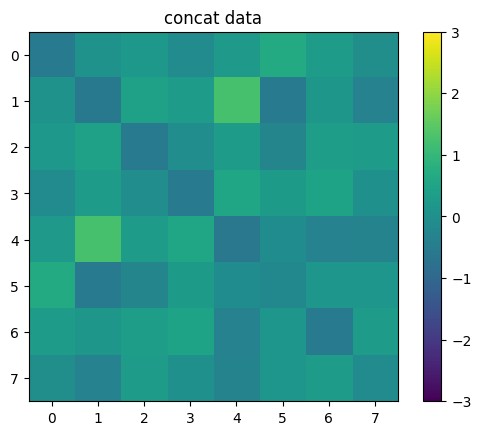

In [13]:
###### here we first define the fixed color range
vmin = -3
vmax = 3

plt.imshow(HandJ(np.array(DATA_LATCHERS.T), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.title('Latchers')
plt.colorbar()
plt.show()








# Plot for Explorers with fixed color range
plt.figure()
plt.title('Explorers')
plt.imshow(HandJ(np.array(DATA_EXPLORERS.T), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.colorbar()
plt.show()










plt.figure()
plt.title('concat data')
plt.imshow(HandJ(np.array(data_p), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.colorbar()
plt.show()


In [ ]:
#

In [14]:
# V
# .shape
H_rand.shape
J_rand.shape
J_rand



array([[-0.51168306,  0.04695579,  0.20297008, -0.09862751,  0.24672563,
         0.65926982,  0.31942403, -0.0252437 ],
       [ 0.04695579, -0.56901129,  0.42988242,  0.32806937,  1.25345442,
        -0.50411135,  0.16591447, -0.32901518],
       [ 0.20297008,  0.42988242, -0.50816571, -0.06585606,  0.32745677,
        -0.26412091,  0.37315633,  0.32650216],
       [-0.09862751,  0.32806937, -0.06585606, -0.54774074,  0.52239894,
         0.27731336,  0.48518888,  0.0101708 ],
       [ 0.24672563,  1.25345442,  0.32745677,  0.52239894, -0.60731941,
        -0.08730189, -0.3412203 , -0.32434868],
       [ 0.65926982, -0.50411135, -0.26412091,  0.27731336, -0.08730189,
        -0.19319553,  0.15220607,  0.15344013],
       [ 0.31942403,  0.16591447,  0.37315633,  0.48518888, -0.3412203 ,
         0.15220607, -0.55965166,  0.31561383],
       [-0.0252437 , -0.32901518,  0.32650216,  0.0101708 , -0.32434868,
         0.15344013,  0.31561383, -0.11550056]])

# Hamiltonian Energy computation

In [15]:
def Hamiltonian(sigma_vec, h_vec, J_mat):



      first_term = np.dot(  h_vec , sigma_vec)

      # print('first term is' , first_term)


      second_term = 0

      N = len(sigma_vec)

      for i in range(N):
        for j in range(i+1, N):

          second_term = second_term + (sigma_vec[i] * sigma_vec[j] * J_mat[i,j])
          # print(i,j)

      second_term2 =   second_term


      energy = -(first_term + second_term2)
      # print(energy )

      return(energy)




In [16]:
J_mat.T == J_mat

array([[ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True]])

In [17]:
import pandas as pd
from collections import Counter


def data_frequency_probability(ROI,data ):
      # Define the 256 patterns, here len(h_vec) is 8 as we considered 8 networks
      patterns = [format(i, '07b') for i in range(2** ROI)]

      # Convert the dataframe to a list of tuples, where each tuple represents a row (sample)
      samples = [tuple(row) for _, row in pd.DataFrame(data).iterrows()]

      # Count the occurrences of each pattern using Counter
      pattern_frequency = Counter(samples)



      P_DATA = {}
      # Print the frequency count for each pattern
      for pattern, count in pattern_frequency.items():
          # print(f"Pattern: {pattern}, Frequency: {count}")
          # print('the pattern is ', str(pattern))

          # p = list(pattern)
          P_DATA[pattern] = count / len(data)



      return(P_DATA,pattern_frequency)



P_DATA, pattern_frequency = data_frequency_probability(ROI,data )



P_DATA_LATCHER, pattern_frequency_LATCHER = data_frequency_probability(ROI,DATA_LATCHERS )

P_DATA_EXPLORER, pattern_frequency_EXPLORER = data_frequency_probability(ROI,DATA_EXPLORERS )




In [18]:

P_DATA



P_DATA_EXPLORER

P_DATA_LATCHER

{(1, 1, 0, 1, 1, 0, 1, 0): 0.003823529411764706,
 (1, 1, 1, 1, 0, 0, 1, 1): 0.0026470588235294116,
 (1, 1, 0, 0, 0, 0, 1, 0): 0.002352941176470588,
 (0, 1, 1, 0, 1, 0, 0, 0): 0.006470588235294118,
 (1, 1, 1, 1, 0, 0, 0, 1): 0.002352941176470588,
 (1, 1, 1, 0, 1, 0, 0, 1): 0.005294117647058823,
 (1, 1, 1, 1, 0, 1, 1, 1): 0.006176470588235294,
 (0, 0, 0, 0, 0, 1, 0, 0): 0.006470588235294118,
 (0, 0, 0, 0, 0, 0, 0, 0): 0.012647058823529412,
 (1, 1, 1, 0, 0, 1, 0, 0): 0.0017647058823529412,
 (1, 1, 1, 0, 1, 1, 1, 1): 0.0058823529411764705,
 (1, 0, 0, 0, 1, 1, 0, 0): 0.005588235294117647,
 (1, 0, 1, 0, 1, 1, 0, 0): 0.0026470588235294116,
 (1, 0, 0, 0, 1, 1, 1, 1): 0.0017647058823529412,
 (1, 1, 0, 0, 1, 1, 0, 1): 0.0017647058823529412,
 (1, 1, 0, 1, 0, 1, 1, 0): 0.004705882352941176,
 (0, 0, 0, 0, 0, 1, 1, 1): 0.007058823529411765,
 (0, 0, 0, 1, 0, 1, 0, 1): 0.005,
 (0, 0, 1, 1, 0, 0, 1, 0): 0.0029411764705882353,
 (1, 0, 1, 1, 1, 0, 1, 0): 0.0026470588235294116,
 (0, 0, 1, 1, 1, 1, 0, 1): 

In [19]:
pattern_frequency

Counter({(1, 1, 0, 1, 1, 0, 1, 0): 25,
         (1, 1, 1, 1, 0, 0, 1, 1): 26,
         (1, 1, 0, 0, 0, 0, 1, 0): 11,
         (0, 1, 1, 0, 1, 0, 0, 0): 50,
         (1, 1, 1, 1, 0, 0, 0, 1): 11,
         (1, 1, 1, 0, 1, 0, 0, 1): 28,
         (1, 1, 1, 1, 0, 1, 1, 1): 35,
         (0, 0, 0, 0, 0, 1, 0, 0): 42,
         (0, 0, 0, 0, 0, 0, 0, 0): 74,
         (1, 1, 1, 0, 0, 1, 0, 0): 15,
         (1, 1, 1, 0, 1, 1, 1, 1): 36,
         (1, 0, 0, 0, 1, 1, 0, 0): 27,
         (1, 0, 1, 0, 1, 1, 0, 0): 11,
         (1, 0, 0, 0, 1, 1, 1, 1): 12,
         (1, 1, 0, 0, 1, 1, 0, 1): 11,
         (1, 1, 0, 1, 0, 1, 1, 0): 18,
         (0, 0, 0, 0, 0, 1, 1, 1): 49,
         (0, 0, 0, 1, 0, 1, 0, 1): 32,
         (0, 0, 1, 1, 0, 0, 1, 0): 17,
         (1, 0, 1, 1, 1, 0, 1, 0): 17,
         (0, 0, 1, 1, 1, 1, 0, 1): 13,
         (0, 0, 0, 1, 1, 0, 0, 1): 17,
         (0, 0, 0, 0, 0, 0, 1, 1): 42,
         (1, 1, 1, 0, 1, 1, 1, 0): 27,
         (0, 1, 1, 0, 1, 1, 0, 0): 20,
         (1, 1, 1, 0, 0, 

In [47]:
np.array(list(P_DATA.values())).sum()


np.array(list(P_DATA_EXPLORER.values())).sum()

np.array(list(P_DATA_LATCHER.values())).sum()


1.0

In [48]:

np.array(list(pattern_frequency.values())).sum()

np.array(list(pattern_frequency_EXPLORER.values())).sum()


np.array(list(pattern_frequency_LATCHER.values())).sum()



3400

In [49]:
data.shape
len(data)

5780

In [20]:
# PATTERNS = np.array()



def generate_combinations(N, h_vec, J_mat):
    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]

    for i in range(2**n):
        combination = [0] * n
        for j in range(n):
            if i & (1 << j):
                combination[j] = 1

        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])

    return combinations




#### Frequency VS Patterns

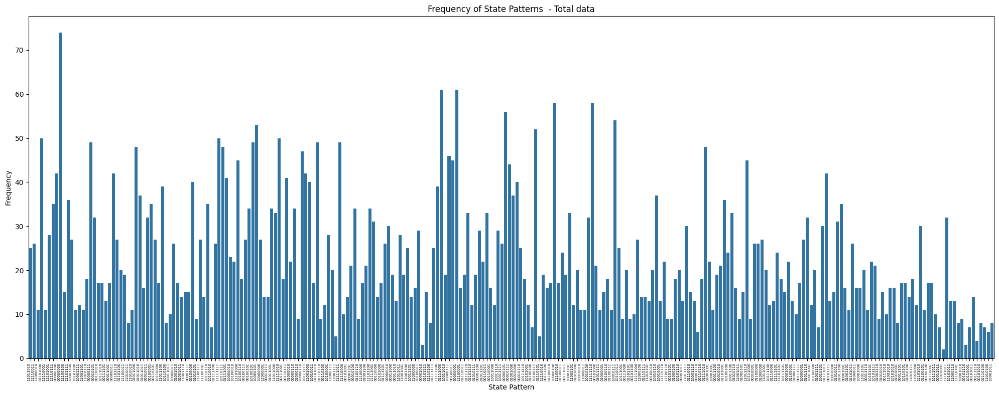

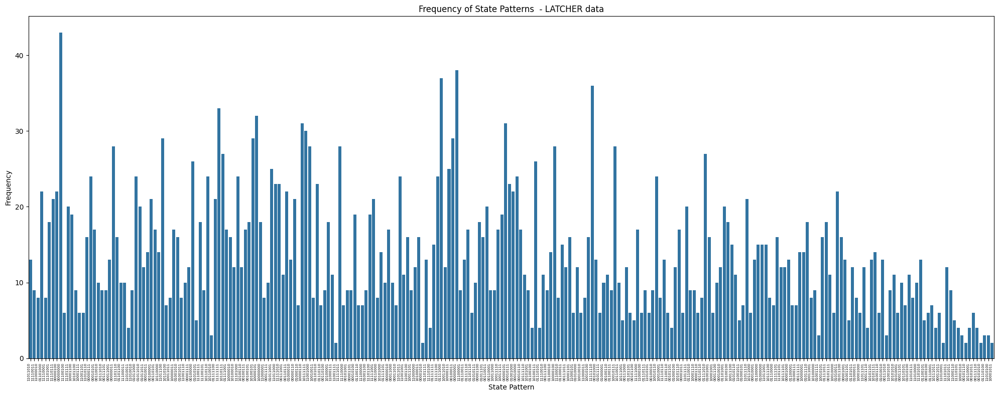

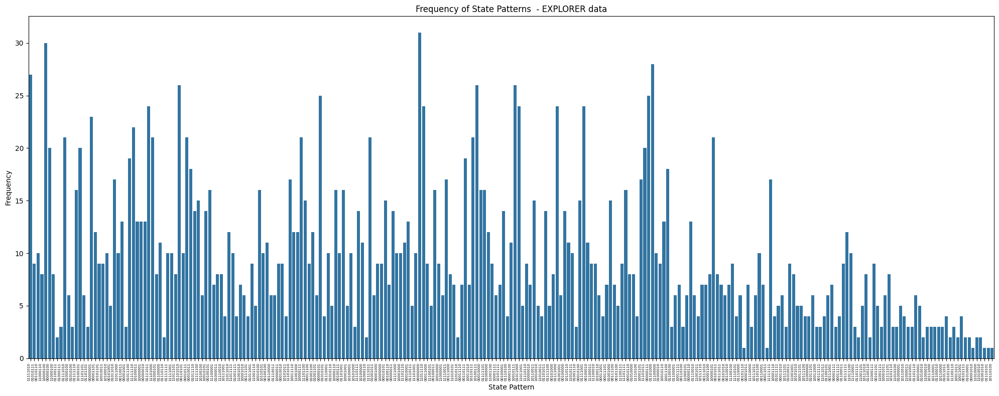

In [51]:

import matplotlib.pyplot as plt
import seaborn as sns

# Extract the patterns and corresponding counts as separate lists
patterns = np.arange(1,1+2**8 )#list(pattern_counts.keys())
counts = list(pattern_frequency.values())




pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency.keys()]
frequencies = list(pattern_frequency.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies)


# # working on xticks:
# Only show every nth label
n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - Total data')

plt.tight_layout()
plt.show()

















counts_LATCHER = list(pattern_frequency_LATCHER.values())
patterns = np.arange(1,1+2**8 )#list(pattern_counts.keys())
counts = list(pattern_frequency.values())




pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency_LATCHER.keys()]
frequencies_LATCHER = list(pattern_frequency_LATCHER.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies_LATCHER)


# # working on xticks:
# Only show every nth label
n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - LATCHER data')

plt.tight_layout()
plt.show()


























counts_EXPLORER = list(pattern_frequency_EXPLORER.values())
pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency_EXPLORER.keys()]
frequencies_EXPLORER = list(pattern_frequency_EXPLORER.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies_EXPLORER)


# # working on xticks:
# Only show every nth label
n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - EXPLORER data')

plt.tight_layout()
plt.show()



















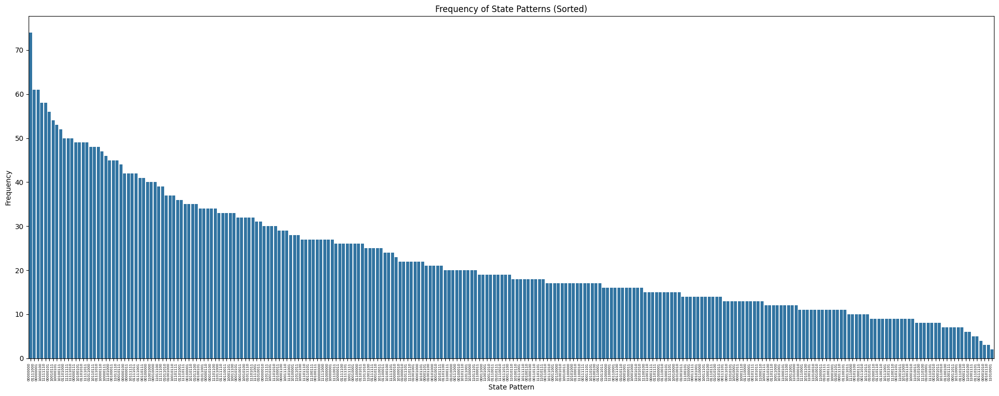

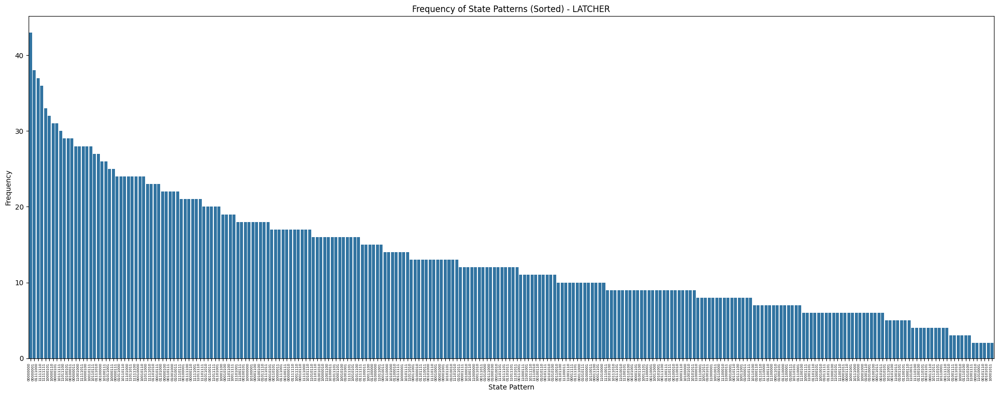

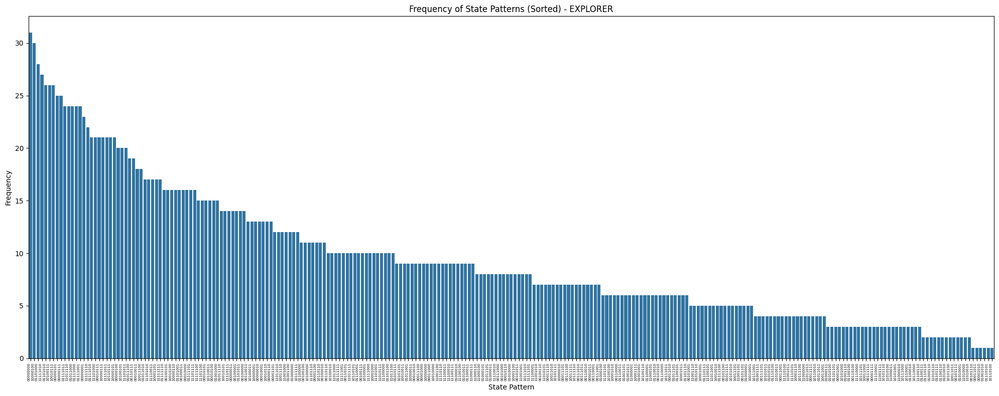

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort the pattern frequency by the frequency values in descending order
sorted_patterns = sorted(pattern_frequency.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted = [''.join(map(str, key)) for key, value in sorted_patterns]
frequencies_sorted = [value for key, value in sorted_patterns]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted, y=frequencies_sorted)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted)')

plt.tight_layout()
plt.show()




























sorted_patterns_LATCHER = sorted(pattern_frequency_LATCHER.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted_LATCHER = [''.join(map(str, key)) for key, value in sorted_patterns_LATCHER]
frequencies_sorted_LATCHER = [value for key, value in sorted_patterns_LATCHER]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted_LATCHER, y=frequencies_sorted_LATCHER)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted) - LATCHER')

plt.tight_layout()
plt.show()






























sorted_patterns_EXPLORER = sorted(pattern_frequency_EXPLORER.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted_EXPLORER = [''.join(map(str, key)) for key, value in sorted_patterns_EXPLORER]
frequencies_sorted_EXPLORER = [value for key, value in sorted_patterns_EXPLORER]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted_EXPLORER, y=frequencies_sorted_EXPLORER)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted) - EXPLORER')

plt.tight_layout()
plt.show()




In [24]:

J_mat.shape

(8, 8)

## Generating Patterns and their energy

In [53]:
###### fateme's energy computation:



sigma = [0,1]
V = np.array(list(itertools.product(sigma, repeat = ROI)))

'dis_grap is a adjanency matrix of disconectivity graph, E is an array, demonstrating energy of all possible pattern(V)'
#energ : E(V_k) = -sum_from 1 to ROI(h_i * sigma_i) -0.5 * sum_from 1 to ROI _ sum_from 1 to ROI (J_ij * sigma_i * sigma_j)

dis_graph = np.zeros((2**ROI,2**ROI))
E = np.zeros(2**ROI)

H_rand, J_rand = HandJ(data_p, ROI, l_t)
E = -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))

for i in range(2**ROI):
  V_k = V[i]
  for j in range(2**ROI):
    metric = np.sum(abs(V[i]-V[j]))
    if metric == 1:
      dis_graph[i][j] = 1

# probability
P = np.exp(-E)/np.sum(np.exp(-E))






for i in range(2**ROI):

  print(tuple(V[i,:]))




  # PATTERNS = np.array()



def generate_combinations(N, h_vec, J_mat):
    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]

    for i in range(2**n):
        combination = [0] * n
        for j in range(n):
            if i & (1 << j):
                combination[j] = 1

        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])

    return combinations



(0, 0, 0, 0, 0, 0, 0, 0)
(0, 0, 0, 0, 0, 0, 0, 1)
(0, 0, 0, 0, 0, 0, 1, 0)
(0, 0, 0, 0, 0, 0, 1, 1)
(0, 0, 0, 0, 0, 1, 0, 0)
(0, 0, 0, 0, 0, 1, 0, 1)
(0, 0, 0, 0, 0, 1, 1, 0)
(0, 0, 0, 0, 0, 1, 1, 1)
(0, 0, 0, 0, 1, 0, 0, 0)
(0, 0, 0, 0, 1, 0, 0, 1)
(0, 0, 0, 0, 1, 0, 1, 0)
(0, 0, 0, 0, 1, 0, 1, 1)
(0, 0, 0, 0, 1, 1, 0, 0)
(0, 0, 0, 0, 1, 1, 0, 1)
(0, 0, 0, 0, 1, 1, 1, 0)
(0, 0, 0, 0, 1, 1, 1, 1)
(0, 0, 0, 1, 0, 0, 0, 0)
(0, 0, 0, 1, 0, 0, 0, 1)
(0, 0, 0, 1, 0, 0, 1, 0)
(0, 0, 0, 1, 0, 0, 1, 1)
(0, 0, 0, 1, 0, 1, 0, 0)
(0, 0, 0, 1, 0, 1, 0, 1)
(0, 0, 0, 1, 0, 1, 1, 0)
(0, 0, 0, 1, 0, 1, 1, 1)
(0, 0, 0, 1, 1, 0, 0, 0)
(0, 0, 0, 1, 1, 0, 0, 1)
(0, 0, 0, 1, 1, 0, 1, 0)
(0, 0, 0, 1, 1, 0, 1, 1)
(0, 0, 0, 1, 1, 1, 0, 0)
(0, 0, 0, 1, 1, 1, 0, 1)
(0, 0, 0, 1, 1, 1, 1, 0)
(0, 0, 0, 1, 1, 1, 1, 1)
(0, 0, 1, 0, 0, 0, 0, 0)
(0, 0, 1, 0, 0, 0, 0, 1)
(0, 0, 1, 0, 0, 0, 1, 0)
(0, 0, 1, 0, 0, 0, 1, 1)
(0, 0, 1, 0, 0, 1, 0, 0)
(0, 0, 1, 0, 0, 1, 0, 1)
(0, 0, 1, 0, 0, 1, 1, 0)
(0, 0, 1, 0, 0, 1, 1, 1)


In [66]:
patterns = generate_combinations(N,h_vec, J_mat)
patterns[1][0]
# patterns

[1, 0, 0, 0, 0, 0, 0, 0]

In [28]:
# PATTERNS = np.array()



def generate_combinations(N, h_vec, J_mat):
    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]

    for i in range(2**n):
        combination = [0] * n
        for j in range(n):
            if i & (1 << j):
                combination[j] = 1

        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])

    return combinations


## P_MODEL vs P_DATA

In [56]:

N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns



patterns_LATCHER = generate_combinations(N,H_latcher, J_latcher)
# patterns





patterns_EXPLORER = generate_combinations(N,H_explorers, J_explorers)
# patterns








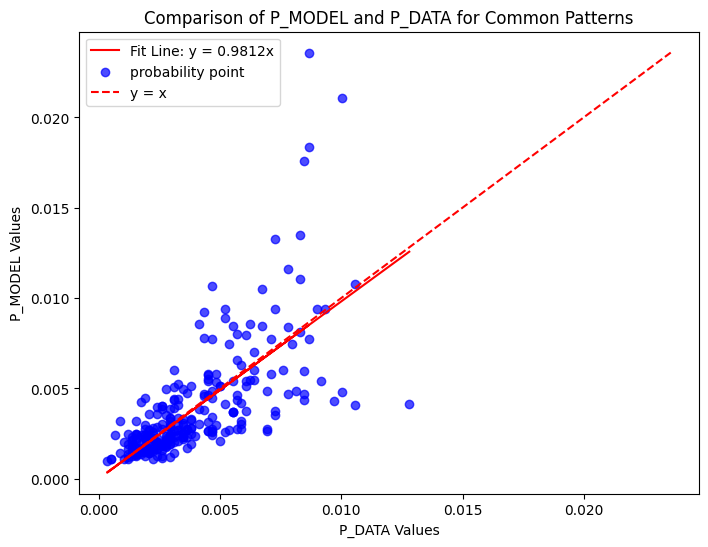

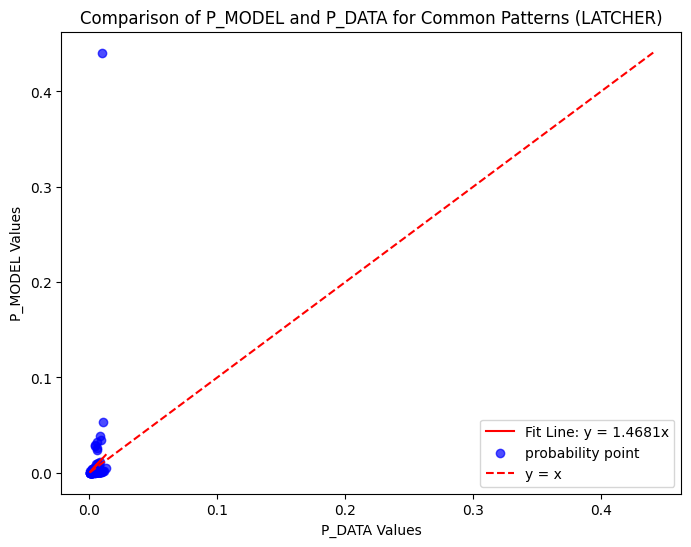

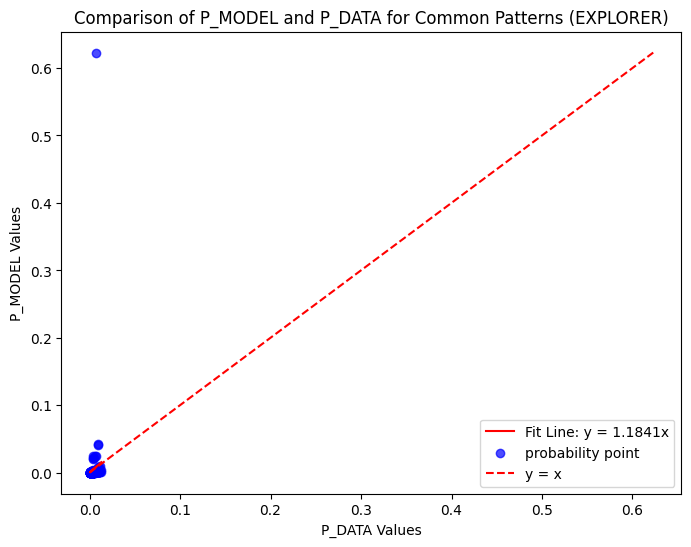

In [32]:
# N = ROI #NUMBER OF ROI
# patterns = generate_combinations(N,h_vec, J_mat)
# patterns



def data_probability(patterns):

        E = []
        P = []
        for m in patterns:
          # print(p,e)

          P.append(m[0])
          E.append(m[1])
          # print(p,e)
        # p


        E = np.array(E)
        total_E = (np.exp(-E)).sum()
        total_E



        # .sum()



        P_MODEL = {}


        for p,e in zip(P,E):

          P_MODEL[tuple(p)] = (np.exp(-e)) / total_E

        return(P_MODEL)





P_MODEL = data_probability(patterns)


P_MODEL_LATCHER = data_probability(patterns_LATCHER)

P_MODEL_EXPLORER = data_probability(patterns_EXPLORER)































Pdf_model = pd.DataFrame(list(P_MODEL.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data = pd.DataFrame(list(P_DATA.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df = pd.merge(Pdf_model, Pdf_data, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m, _ = nnls(Pmerged_df['P_DATA'].values.reshape(-1,1), Pmerged_df['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df['P_DATA'], m * Pmerged_df['P_DATA'], color='red', label=f'Fit Line: y = {m[0]:.4f}x')



plt.scatter( Pmerged_df['P_DATA'],Pmerged_df['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df['P_MODEL'].min(), Pmerged_df['P_DATA'].min()),
                     max(Pmerged_df['P_MODEL'].max(), Pmerged_df['P_DATA'].max()), 100)
plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

# Add labels and title
plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns')
plt.legend()

# Show plot
plt.show()































Pdf_model_LATCHER = pd.DataFrame(list(P_MODEL_LATCHER.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data_LATCHER = pd.DataFrame(list(P_DATA_LATCHER.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df_LATCHER = pd.merge(Pdf_model_LATCHER, Pdf_data_LATCHER, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m2, _ = nnls(Pmerged_df_LATCHER['P_DATA'].values.reshape(-1,1), Pmerged_df_LATCHER['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df_LATCHER['P_DATA'], m2 * Pmerged_df_LATCHER['P_DATA'], color='red', label=f'Fit Line: y = {m2[0]:.4f}x')



plt.scatter( Pmerged_df_LATCHER['P_DATA'],Pmerged_df_LATCHER['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df_LATCHER['P_MODEL'].min(), Pmerged_df_LATCHER['P_DATA'].min()),
                     max(Pmerged_df_LATCHER['P_MODEL'].max(), Pmerged_df_LATCHER['P_DATA'].max()), 100)
plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

# Add labels and title
plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns (LATCHER)')
plt.legend()

# Show plot
plt.show()


































Pdf_model_EXPLORER = pd.DataFrame(list(P_MODEL_EXPLORER.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data_EXPLORER = pd.DataFrame(list(P_DATA_EXPLORER.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df_EXPLORER = pd.merge(Pdf_model_EXPLORER, Pdf_data_EXPLORER, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m3, _ = nnls(Pmerged_df_EXPLORER['P_DATA'].values.reshape(-1,1), Pmerged_df_EXPLORER['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df_EXPLORER['P_DATA'], m3 * Pmerged_df_EXPLORER['P_DATA'], color='red', label=f'Fit Line: y = {m3[0]:.4f}x')



plt.scatter( Pmerged_df_EXPLORER['P_DATA'],Pmerged_df_EXPLORER['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df_EXPLORER['P_MODEL'].min(), Pmerged_df_EXPLORER['P_DATA'].min()),
                     max(Pmerged_df_EXPLORER['P_MODEL'].max(), Pmerged_df_EXPLORER['P_DATA'].max()), 100)
plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

# Add labels and title
plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns (EXPLORER)')
plt.legend()

# Show plot
plt.show()




In [37]:
P_DATA

{(1, 1, 0, 1, 1, 0, 1, 0): 0.004325259515570935,
 (1, 1, 1, 1, 0, 0, 1, 1): 0.004498269896193772,
 (1, 1, 0, 0, 0, 0, 1, 0): 0.0019031141868512112,
 (0, 1, 1, 0, 1, 0, 0, 0): 0.00865051903114187,
 (1, 1, 1, 1, 0, 0, 0, 1): 0.0019031141868512112,
 (1, 1, 1, 0, 1, 0, 0, 1): 0.004844290657439446,
 (1, 1, 1, 1, 0, 1, 1, 1): 0.006055363321799308,
 (0, 0, 0, 0, 0, 1, 0, 0): 0.00726643598615917,
 (0, 0, 0, 0, 0, 0, 0, 0): 0.012802768166089966,
 (1, 1, 1, 0, 0, 1, 0, 0): 0.0025951557093425604,
 (1, 1, 1, 0, 1, 1, 1, 1): 0.006228373702422145,
 (1, 0, 0, 0, 1, 1, 0, 0): 0.004671280276816609,
 (1, 0, 1, 0, 1, 1, 0, 0): 0.0019031141868512112,
 (1, 0, 0, 0, 1, 1, 1, 1): 0.0020761245674740486,
 (1, 1, 0, 0, 1, 1, 0, 1): 0.0019031141868512112,
 (1, 1, 0, 1, 0, 1, 1, 0): 0.0031141868512110727,
 (0, 0, 0, 0, 0, 1, 1, 1): 0.008477508650519031,
 (0, 0, 0, 1, 0, 1, 0, 1): 0.005536332179930796,
 (0, 0, 1, 1, 0, 0, 1, 0): 0.0029411764705882353,
 (1, 0, 1, 1, 1, 0, 1, 0): 0.0029411764705882353,
 (0, 0, 1, 1,

In [149]:
m

array([0.86131999])

In [39]:
Pmerged_df['P_MODEL'].values.reshape(-1,1).shape


(256, 1)

In [38]:

pattern_frequency[(0, 0, 0, 0, 0, 0, 0, 0)]




126

In [42]:
126/ len(data)

0.02115869017632242

0.02115869017632242

In [150]:
Pdf_data['P_DATA'].sum()

1.0

In [151]:

Pdf_model['P_MODEL'].sum()

1.0

In [152]:
from scipy.stats import pearsonr
R, _ = pearsonr(Pmerged_df['P_DATA'], Pmerged_df['P_MODEL'])
print(R)

0.8853345528985122


In [153]:
from scipy.stats import pearsonr
R_LATCHER, _ = pearsonr(Pmerged_df_LATCHER['P_DATA'], Pmerged_df_LATCHER['P_MODEL'])
print(R_LATCHER)

0.6165283987669029


In [46]:
from scipy.stats import pearsonr
R_EXPLORER, _ = pearsonr(Pmerged_df_EXPLORER['P_DATA'], Pmerged_df_EXPLORER['P_MODEL'])
print(R_EXPLORER)

0.16498275577426644


In [154]:



N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns




edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges.append((i+1,j+1))
        print(i+1,j+1, patterns[i][0], patterns[j][0])


edges


















edges_LATCHER = []

for i in range(len(patterns_LATCHER)):
  for j in range(len(patterns_LATCHER)):
    if i <= j:
      differences = np.abs(np.array(patterns_LATCHER[i][0]) - np.array(patterns_LATCHER[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges_LATCHER.append((i+1,j+1))
        # print(i+1,j+1, patterns_LATCHER[i][0], patterns_LATCHER[j][0])


edges_LATCHER








edges_EXPLORER = []

for i in range(len(patterns_EXPLORER)):
  for j in range(len(patterns_EXPLORER)):
    if i <= j:
      differences = np.abs(np.array(patterns_EXPLORER[i][0]) - np.array(patterns_EXPLORER[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges_EXPLORER.append((i+1,j+1))
        # print(i+1,j+1, patterns[i][0], patterns[j][0])


edges_EXPLORER

1 2 [0, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 0, 0, 0, 0, 0]
1 3 [0, 0, 0, 0, 0, 0, 0, 0] [0, 1, 0, 0, 0, 0, 0, 0]
1 5 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 1, 0, 0, 0, 0, 0]
1 9 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 1, 0, 0, 0, 0]
1 17 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 1, 0, 0, 0]
1 33 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 1, 0, 0]
1 65 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 0, 1, 0]
1 129 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 0, 0, 1]
2 4 [1, 0, 0, 0, 0, 0, 0, 0] [1, 1, 0, 0, 0, 0, 0, 0]
2 6 [1, 0, 0, 0, 0, 0, 0, 0] [1, 0, 1, 0, 0, 0, 0, 0]
2 10 [1, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 1, 0, 0, 0, 0]
2 18 [1, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 0, 1, 0, 0, 0]
2 34 [1, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 0, 0, 1, 0, 0]
2 66 [1, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 0, 0, 0, 1, 0]
2 130 [1, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 0, 0, 0, 0, 1]
3 4 [0, 1, 0, 0, 0, 0, 0, 0] [1, 1, 0, 0, 0, 0, 0, 0]
3 7 [0, 1, 0, 0, 0, 0, 0, 0] [0, 1, 1, 0, 0, 0, 0, 0]
3 11 [0, 1, 0, 0, 0, 0, 0, 0] [0, 1, 0, 1, 0, 0, 0, 0]
3 19 [0, 1, 0, 0

[(1, 2),
 (1, 3),
 (1, 5),
 (1, 9),
 (1, 17),
 (1, 33),
 (1, 65),
 (1, 129),
 (2, 4),
 (2, 6),
 (2, 10),
 (2, 18),
 (2, 34),
 (2, 66),
 (2, 130),
 (3, 4),
 (3, 7),
 (3, 11),
 (3, 19),
 (3, 35),
 (3, 67),
 (3, 131),
 (4, 8),
 (4, 12),
 (4, 20),
 (4, 36),
 (4, 68),
 (4, 132),
 (5, 6),
 (5, 7),
 (5, 13),
 (5, 21),
 (5, 37),
 (5, 69),
 (5, 133),
 (6, 8),
 (6, 14),
 (6, 22),
 (6, 38),
 (6, 70),
 (6, 134),
 (7, 8),
 (7, 15),
 (7, 23),
 (7, 39),
 (7, 71),
 (7, 135),
 (8, 16),
 (8, 24),
 (8, 40),
 (8, 72),
 (8, 136),
 (9, 10),
 (9, 11),
 (9, 13),
 (9, 25),
 (9, 41),
 (9, 73),
 (9, 137),
 (10, 12),
 (10, 14),
 (10, 26),
 (10, 42),
 (10, 74),
 (10, 138),
 (11, 12),
 (11, 15),
 (11, 27),
 (11, 43),
 (11, 75),
 (11, 139),
 (12, 16),
 (12, 28),
 (12, 44),
 (12, 76),
 (12, 140),
 (13, 14),
 (13, 15),
 (13, 29),
 (13, 45),
 (13, 77),
 (13, 141),
 (14, 16),
 (14, 30),
 (14, 46),
 (14, 78),
 (14, 142),
 (15, 16),
 (15, 31),
 (15, 47),
 (15, 79),
 (15, 143),
 (16, 32),
 (16, 48),
 (16, 80),
 (16, 144),


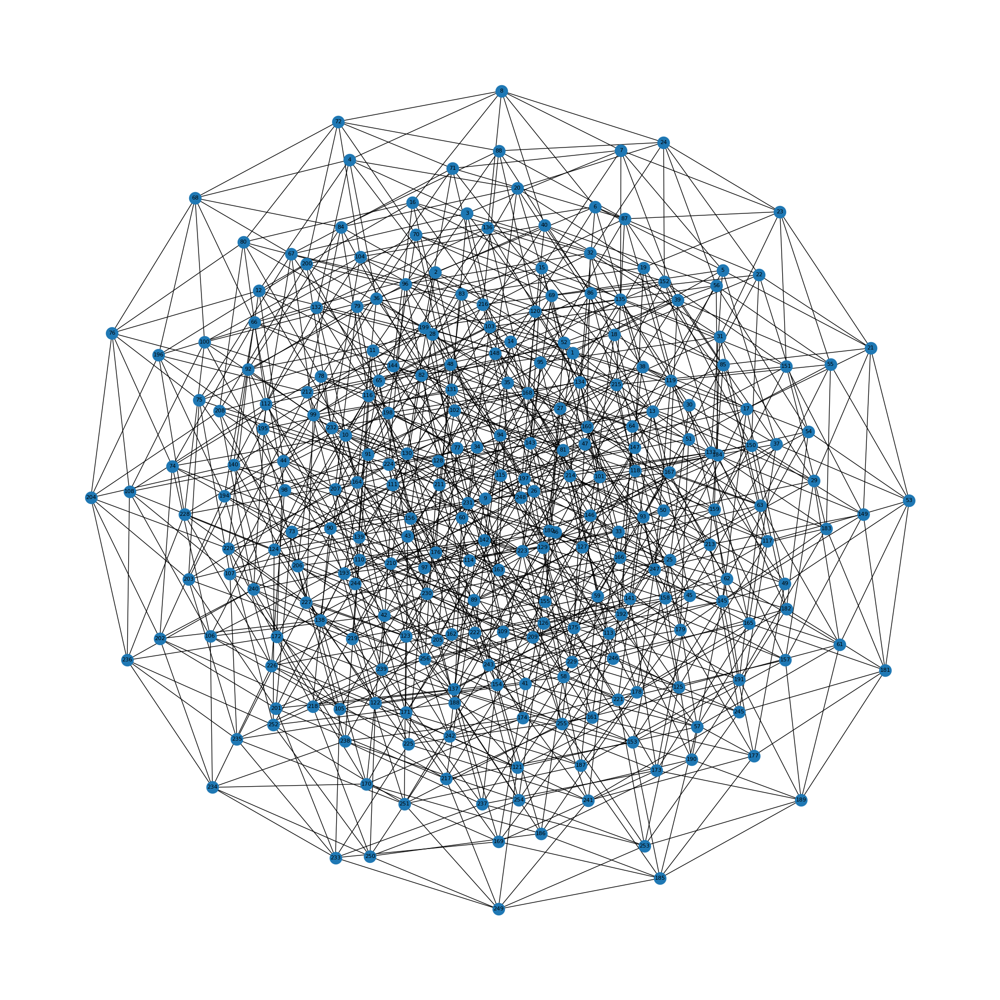

In [159]:

# creating the graph of the patterns :
edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))





G = nx.Graph()

G.add_edges_from(edges)

# nx.draw(G, with_labels=True)
# plt.show()



# pos=nx.spring_layout(G) #default to scale=1

# nx.draw(G,pos)
# pos=nx.spring_layout(G,scale=.5) # double distance between all nodes

# nx.draw(G,pos, with_labels=True)


pos=nx.spring_layout(G)
plt.figure(1,figsize=(20,20))

nx.draw(G,pos,font_size=8, with_labels=True)

#nx.draw(G,pos,font_size=10)











Text(0.5, 1.0, 'LATCHER')

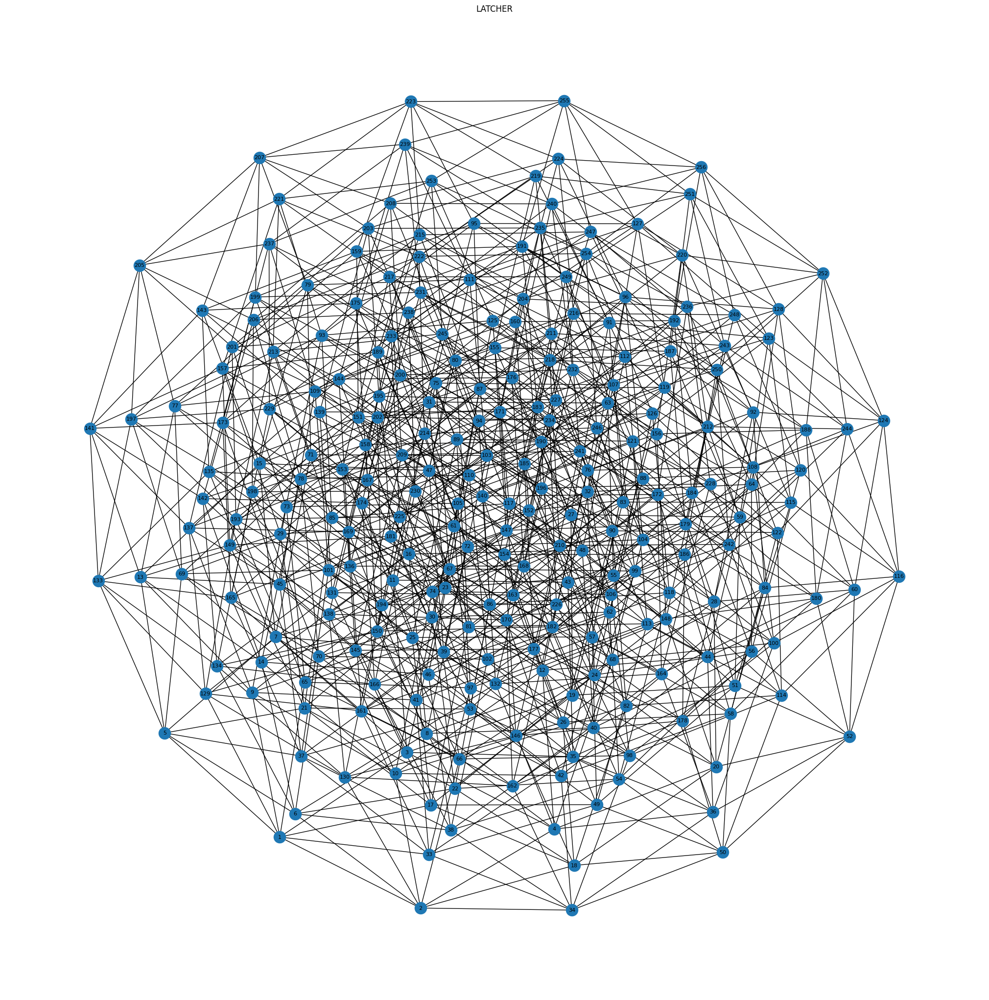

In [158]:


G_LATCHER = nx.Graph()

G_LATCHER.add_edges_from(edges_LATCHER)


pos=nx.spring_layout(G_LATCHER)
plt.figure(1,figsize=(20,20))
nx.draw(G_LATCHER,pos,font_size=8, with_labels=True)
plt.title('LATCHER')



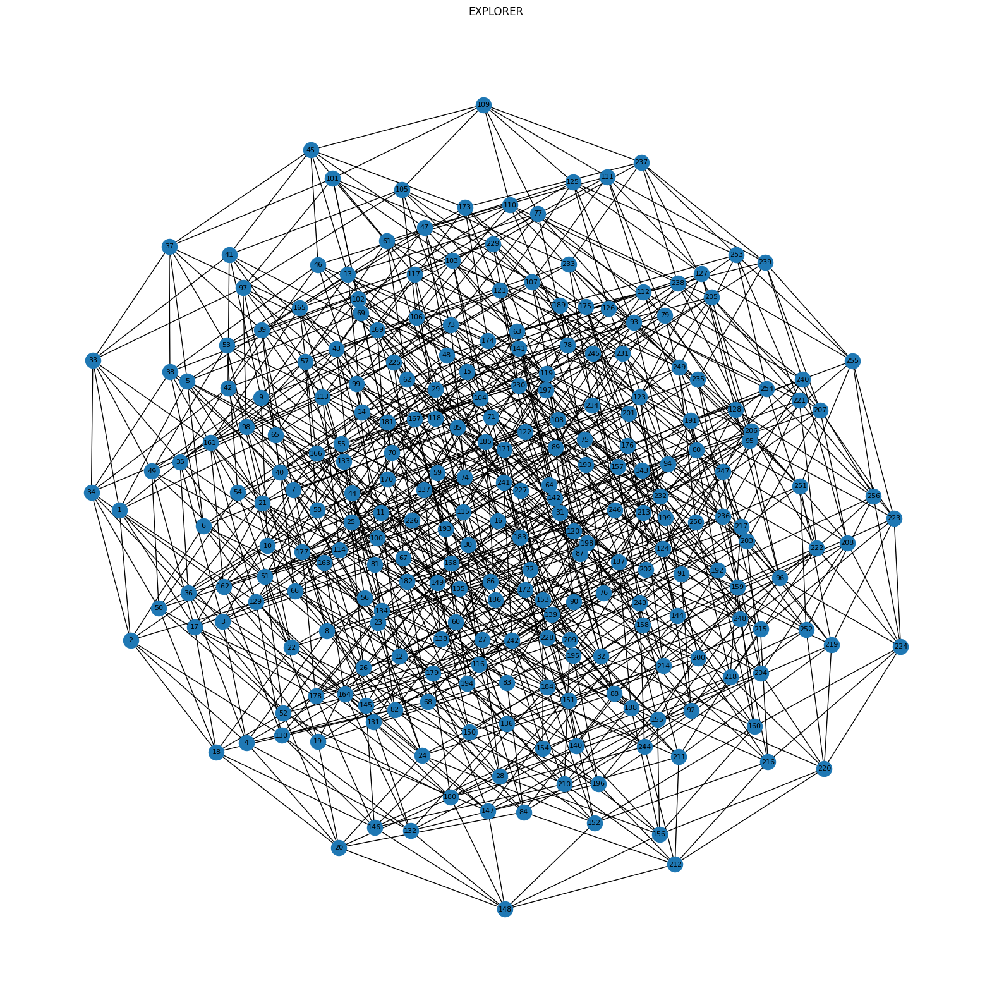

In [157]:

G_EXPLORER = nx.Graph()
G_EXPLORER.add_edges_from(edges_EXPLORER)
pos=nx.spring_layout(G_EXPLORER)
plt.figure(1,figsize=(20,20))
plt.title('EXPLORER')
nx.draw(G_EXPLORER,pos,font_size=8, with_labels=True)

In [160]:
# Defining a dictionary called NODES that record the number of node, its patterns and its energy simultaneously:

NODES = {}
for node , (i,j) in enumerate(patterns):
  # print(i,j,node+1)

  NODES[node+1] = [i,j]










NODES_LATCHER = {}
for node , (i,j) in enumerate(patterns_LATCHER):

  NODES_LATCHER[node+1] = [i,j]





NODES_EXPLORER = {}
for node , (i,j) in enumerate(patterns_EXPLORER):


  NODES_EXPLORER[node+1] = [i,j]

In [161]:
NODES

NODES_EXPLORER


NODES_LATCHER

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[1, 0, 0, 0, 0, 0, 0, 0], 1.550512625770506],
 3: [[0, 1, 0, 0, 0, 0, 0, 0], 1.6136986749983238],
 4: [[1, 1, 0, 0, 0, 0, 0, 0], 3.176739316187005],
 5: [[0, 0, 1, 0, 0, 0, 0, 0], 1.519818912544281],
 6: [[1, 0, 1, 0, 0, 0, 0, 0], 2.7684167441070815],
 7: [[0, 1, 1, 0, 0, 0, 0, 0], 2.897890072358319],
 8: [[1, 1, 1, 0, 0, 0, 0, 0], 4.1590159193392955],
 9: [[0, 0, 0, 1, 0, 0, 0, 0], 1.60374931934124],
 10: [[1, 0, 0, 1, 0, 0, 0, 0], 2.9751813844522452],
 11: [[0, 1, 0, 1, 0, 0, 0, 0], 2.6920668872598155],
 12: [[1, 1, 0, 1, 0, 0, 0, 0], 4.076026967788995],
 13: [[0, 0, 1, 1, 0, 0, 0, 0], 2.868682437478657],
 14: [[1, 0, 1, 1, 0, 0, 0, 0], 3.9381997083819567],
 15: [[0, 1, 1, 1, 0, 0, 0, 0], 3.7213724902129464],
 16: [[1, 1, 1, 1, 0, 0, 0, 0], 4.803417776534422],
 17: [[0, 0, 0, 0, 1, 0, 0, 0], 1.643194729851537],
 18: [[1, 0, 0, 0, 1, 0, 0, 0], 2.620187973720706],
 19: [[0, 1, 0, 0, 1, 0, 0, 0], 2.368163869338276],
 20: [[1, 1, 0, 0, 1, 0, 0, 

In [53]:
 [[0, 1, 1, 1, 0, 0, 0, 0], 0.8129992993728519],


([[0, 1, 1, 1, 0, 0, 0, 0], 0.8129992993728519],)

#### Energy VS Frequency

In [162]:
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[1, 0, 0, 0, 0, 0, 0, 0], 0.6353220162845249],
 [[0, 1, 0, 0, 0, 0, 0, 0], 0.6753119954756387],
 [[1, 1, 0, 0, 0, 0, 0, 0], 1.3400829616655985],
 [[0, 0, 1, 0, 0, 0, 0, 0], 0.5432495757502309],
 [[1, 0, 1, 0, 0, 0, 0, 0], 1.0504921026028256],
 [[0, 1, 1, 0, 0, 0, 0, 0], 1.0529223456496688],
 [[1, 1, 1, 0, 0, 0, 0, 0], 1.5896138224076988],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.6652330985598032],
 [[1, 0, 0, 1, 0, 0, 0, 0], 1.268977027407841],
 [[0, 1, 0, 1, 0, 0, 0, 0], 1.0748429696087287],
 [[1, 1, 0, 1, 0, 0, 0, 0], 1.7080358483622016],
 [[0, 0, 1, 1, 0, 0, 0, 0], 1.1046340758238231],
 [[1, 0, 1, 1, 0, 0, 0, 0], 1.5802985152399307],
 [[0, 1, 1, 1, 0, 0, 0, 0], 1.3486047212965482],
 [[1, 1, 1, 1, 0, 0, 0, 0], 1.8537181106180907],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.6342312937693443],
 [[1, 0, 0, 0, 1, 0, 0, 0], 0.9966613996504342],
 [[0, 1, 0, 0, 1, 0, 0, 0], 0.7093090096049248],
 [[1, 1, 0, 0, 1, 0, 0, 0], 1.1011880653914499],
 [[0, 0, 1, 0, 1, 0, 0, 0], 1.05113

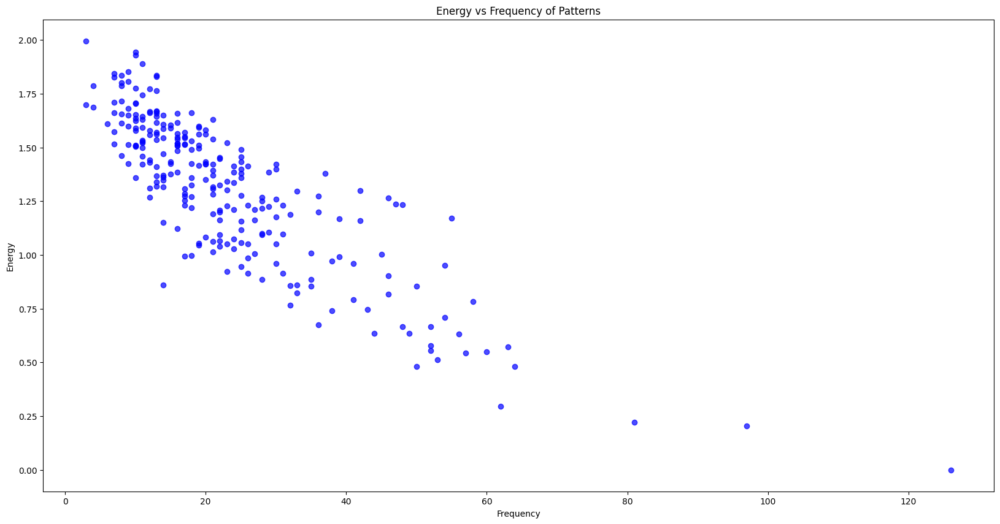

In [163]:


import numpy as np
import matplotlib.pyplot as plt
from collections import Counter



pattern_data = []

for pattern_list, energy in patterns:
    pattern_tuple = tuple(pattern_list)
    if pattern_tuple in pattern_frequency:
        frequency = pattern_frequency[pattern_tuple]
        pattern_data.append((pattern_tuple, frequency, energy))

frequencies = [item[1] for item in pattern_data]
energies = [item[2] for item in pattern_data]

plt.figure(figsize=(20, 10))

plt.scatter(frequencies, energies, color='blue', alpha=0.7)
plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns')
# plt.grid(True)
plt.show()


In [ ]:
# pd.DataFrame(pattern_data)
# list(pattern_data[0][0])

In [56]:
# pattern_data
pattern_frequency

Counter({(1, 1, 0, 0, 0, 0, 0, 0): 13,
         (1, 1, 0, 0, 1, 1, 0, 1): 21,
         (0, 0, 1, 1, 0, 0, 1, 0): 22,
         (1, 0, 0, 0, 0, 1, 0, 0): 64,
         (1, 0, 0, 1, 1, 1, 0, 0): 32,
         (1, 0, 0, 1, 1, 1, 1, 1): 25,
         (1, 0, 0, 1, 1, 1, 0, 1): 24,
         (1, 0, 1, 1, 1, 1, 1, 1): 42,
         (1, 0, 1, 1, 1, 1, 0, 1): 21,
         (1, 1, 1, 1, 0, 1, 1, 1): 30,
         (1, 0, 0, 0, 0, 0, 1, 0): 30,
         (1, 1, 1, 1, 1, 0, 1, 1): 36,
         (0, 0, 0, 0, 0, 1, 0, 0): 97,
         (0, 0, 0, 0, 0, 0, 0, 0): 126,
         (0, 0, 0, 0, 0, 0, 1, 0): 50,
         (0, 0, 0, 1, 1, 1, 1, 1): 16,
         (0, 0, 1, 0, 0, 1, 1, 1): 41,
         (0, 1, 1, 0, 1, 0, 1, 1): 24,
         (0, 1, 1, 1, 1, 0, 0, 1): 39,
         (0, 1, 1, 1, 0, 0, 0, 0): 14,
         (0, 1, 1, 1, 1, 0, 1, 0): 42,
         (1, 1, 1, 0, 0, 0, 1, 1): 15,
         (0, 0, 0, 0, 1, 1, 1, 0): 8,
         (0, 0, 0, 0, 1, 1, 0, 0): 26,
         (1, 0, 1, 0, 1, 1, 0, 1): 21,
         (1, 1, 1, 1, 0, 

<ipython-input-164-663a43f13ab9>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


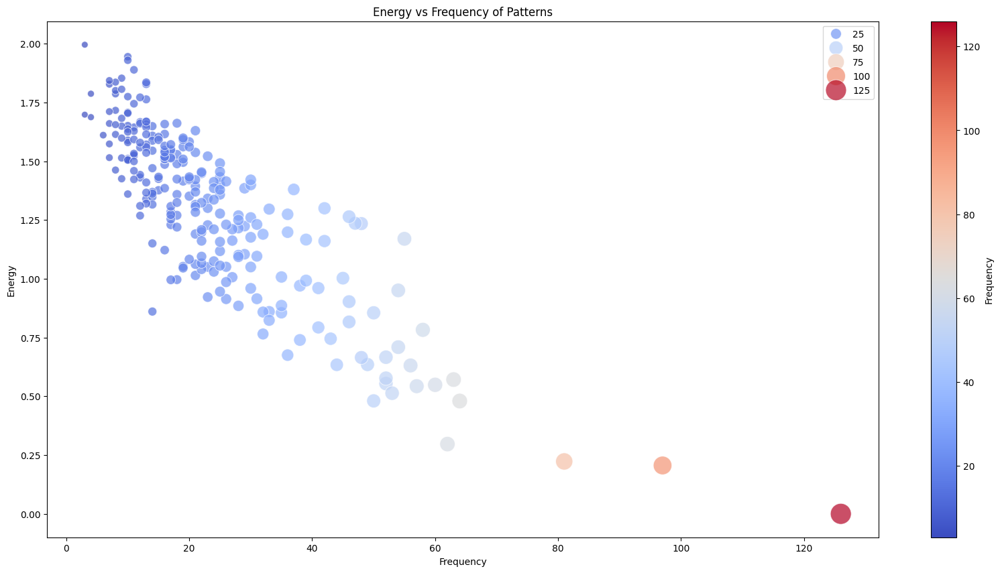

<ipython-input-164-663a43f13ab9>:104: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


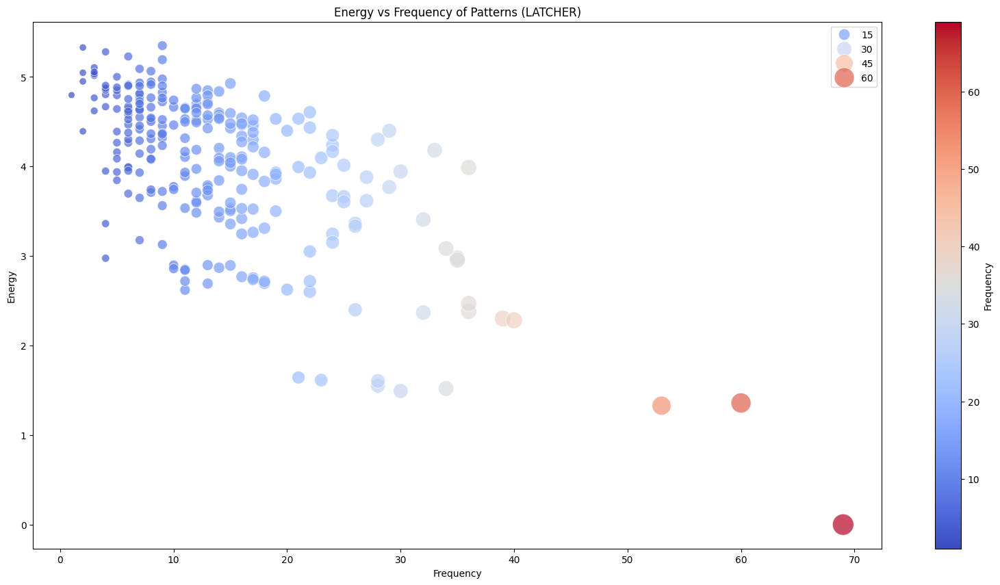

<ipython-input-164-663a43f13ab9>:168: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


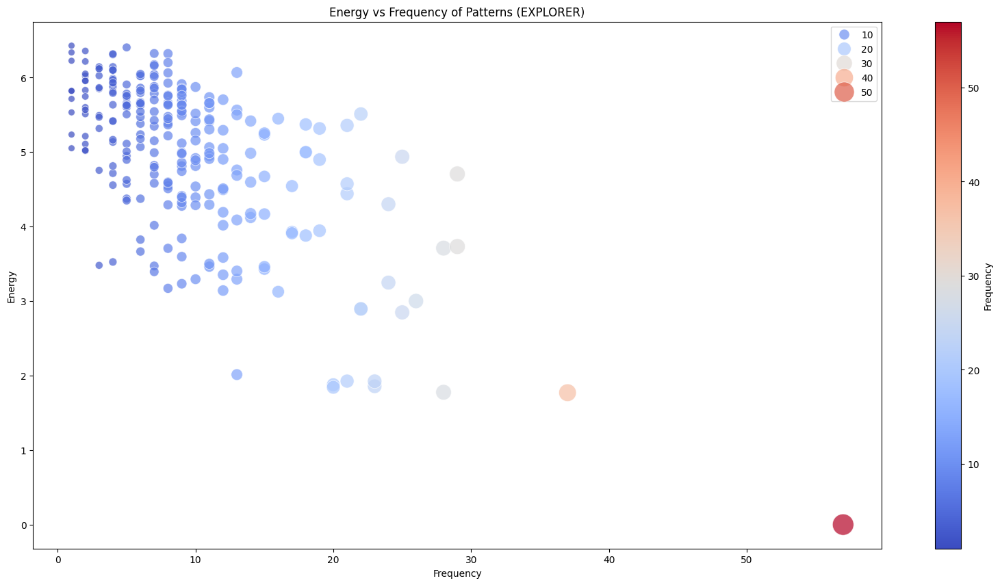

In [164]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

pattern_data = []

for pattern_list, energy in patterns:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency:
        frequency = pattern_frequency[pattern_tuple]
        pattern_data.append((pattern_tuple, frequency, energy))




frequencies = [item[1] for item in pattern_data]
energies = [item[2] for item in pattern_data]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies, y=energies,
    size=frequencies, hue=frequencies,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies), np.max(frequencies))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()
































pattern_data_LATCHER = []

for pattern_list, energy in patterns_LATCHER:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency_LATCHER:
        frequency = pattern_frequency_LATCHER[pattern_tuple]
        pattern_data_LATCHER.append((pattern_tuple, frequency, energy))




frequencies_LATCHER = [item[1] for item in pattern_data_LATCHER]
energies_LATCHER = [item[2] for item in pattern_data_LATCHER]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies_LATCHER, y=energies_LATCHER,
    size=frequencies_LATCHER, hue=frequencies_LATCHER,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns (LATCHER)')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies_LATCHER), np.max(frequencies_LATCHER))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()





























pattern_data_EXPLORER = []

for pattern_list, energy in patterns_EXPLORER:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency_EXPLORER:
        frequency = pattern_frequency_EXPLORER[pattern_tuple]
        pattern_data_EXPLORER.append((pattern_tuple, frequency, energy))




frequencies_EXPLORER = [item[1] for item in pattern_data_EXPLORER]
energies_EXPLORER = [item[2] for item in pattern_data_EXPLORER]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies_EXPLORER, y=energies_EXPLORER,
    size=frequencies_EXPLORER, hue=frequencies_EXPLORER,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns (EXPLORER)')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies_EXPLORER), np.max(frequencies_EXPLORER))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()


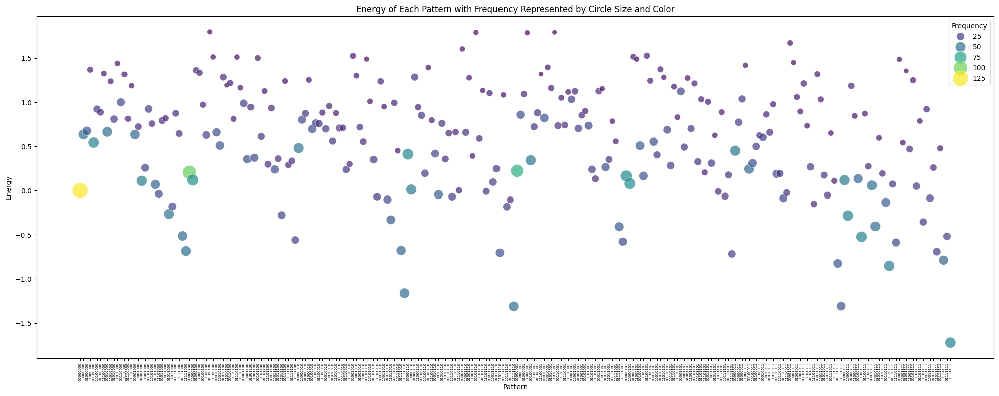

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Create a list of pattern strings for better readability in the plot
pattern_strings = [''.join(map(str, pattern[0])) for pattern in patterns]

# Extract the corresponding energies and frequencies from the original data
energies = [pattern[1] for pattern in patterns]
frequencies = [pattern_frequency.get(tuple(pattern[0]), 0) for pattern in patterns]  # Convert to tuple

# Create a DataFrame for plotting
data = pd.DataFrame({
    'Pattern': pattern_strings,
    'Energy': energies,
    'Frequency': frequencies
})

# Plot using seaborn scatterplot
plt.figure(figsize=(20, 8))
scatter = sns.scatterplot(
    x='Pattern', y='Energy', size='Frequency', hue='Frequency',
    sizes=(50, 500), palette='viridis', data=data, alpha=0.7
)





plt.xlabel('Pattern')
plt.ylabel('Energy')
plt.title('Energy of Each Pattern with Frequency Represented by Circle Size and Color')

plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()


Text(0, 0.5, 'frequency')

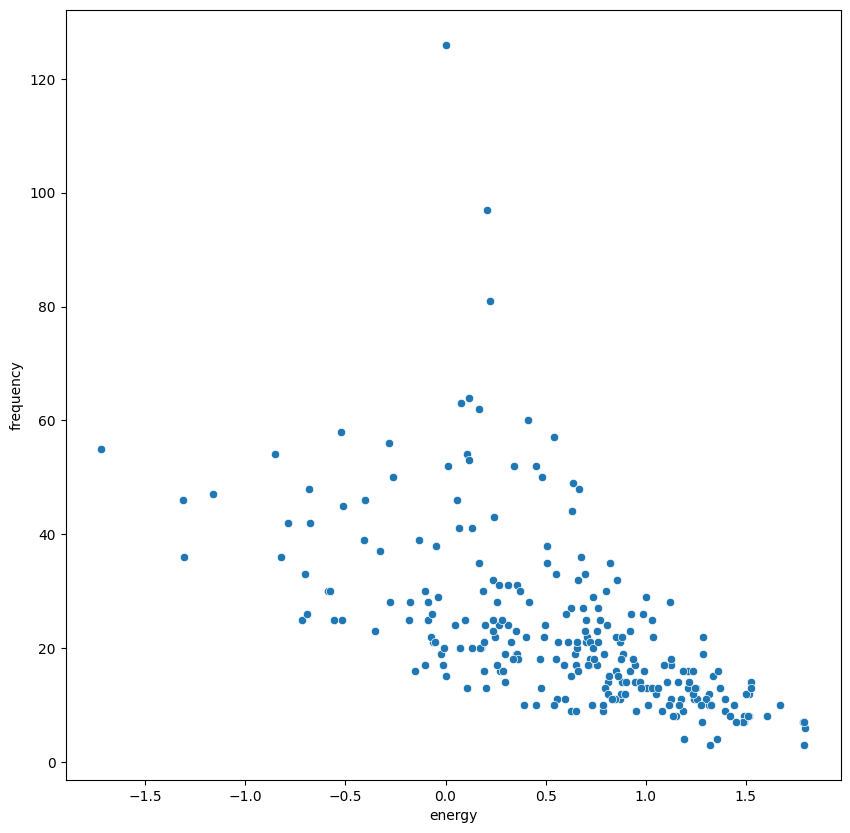

In [59]:

N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns






ALL = {}

for k in pattern_frequency.keys():

    # print(k)
    for p in patterns:

        # print(p[0], list(k))

        if list(k) == p[0]:

            ALL[k] = [ pattern_frequency[k], p[1] ]
#     patterns
# pattern_counts


# ALL[(0, 0, 0, 0, 1, 0, 1)]

ALL









# pattern_counts

#8 networks and t0 threshold considered.







freq = []
energy = []

for k in ALL.keys():

    freq.append(ALL[k][0])
    energy.append(ALL[k][1])


len(energy)


plt.figure(figsize = (10,10))


sns.scatterplot( x = energy ,y  =freq)


plt.xlabel('energy')

plt.ylabel('frequency')






In [60]:
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[1, 0, 0, 0, 0, 0, 0, 0], 0.6353220162845249],
 [[0, 1, 0, 0, 0, 0, 0, 0], 0.6753119954756387],
 [[1, 1, 0, 0, 0, 0, 0, 0], 1.3695319115710334],
 [[0, 0, 1, 0, 0, 0, 0, 0], 0.5432495757502309],
 [[1, 0, 1, 0, 0, 0, 0, 0], 0.9224126131708955],
 [[0, 1, 1, 0, 0, 0, 0, 0], 0.8872831200734683],
 [[1, 1, 1, 0, 0, 0, 0, 0], 1.325344057305003],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.6652330985598032],
 [[1, 0, 0, 1, 0, 0, 0, 0], 1.2373989399713539],
 [[0, 1, 0, 1, 0, 0, 0, 0], 0.8091408451820157],
 [[1, 1, 0, 1, 0, 0, 0, 0], 1.4402045864044366],
 [[0, 0, 1, 1, 0, 0, 0, 0], 1.0007854773376121],
 [[1, 0, 1, 1, 0, 0, 0, 0], 1.3167923398853028],
 [[0, 1, 1, 1, 0, 0, 0, 0], 0.8134147728074235],
 [[1, 1, 1, 1, 0, 0, 0, 0], 1.1883195351659839],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.6342312937693443],
 [[1, 0, 0, 0, 1, 0, 0, 0], 0.7237694892469992],
 [[0, 1, 0, 0, 1, 0, 0, 0], 0.10907472996486667],
 [[1, 1, 0, 0, 1, 0, 0, 0], 0.25751082525339175],
 [[0, 0, 1, 0, 1, 0, 0, 0], 0.924

In [61]:
NODES

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[1, 0, 0, 0, 0, 0, 0, 0], 0.6353220162845249],
 3: [[0, 1, 0, 0, 0, 0, 0, 0], 0.6753119954756387],
 4: [[1, 1, 0, 0, 0, 0, 0, 0], 1.3695319115710334],
 5: [[0, 0, 1, 0, 0, 0, 0, 0], 0.5432495757502309],
 6: [[1, 0, 1, 0, 0, 0, 0, 0], 0.9224126131708955],
 7: [[0, 1, 1, 0, 0, 0, 0, 0], 0.8872831200734683],
 8: [[1, 1, 1, 0, 0, 0, 0, 0], 1.325344057305003],
 9: [[0, 0, 0, 1, 0, 0, 0, 0], 0.6652330985598032],
 10: [[1, 0, 0, 1, 0, 0, 0, 0], 1.2373989399713539],
 11: [[0, 1, 0, 1, 0, 0, 0, 0], 0.8091408451820157],
 12: [[1, 1, 0, 1, 0, 0, 0, 0], 1.4402045864044366],
 13: [[0, 0, 1, 1, 0, 0, 0, 0], 1.0007854773376121],
 14: [[1, 0, 1, 1, 0, 0, 0, 0], 1.3167923398853028],
 15: [[0, 1, 1, 1, 0, 0, 0, 0], 0.8134147728074235],
 16: [[1, 1, 1, 1, 0, 0, 0, 0], 1.1883195351659839],
 17: [[0, 0, 0, 0, 1, 0, 0, 0], 0.6342312937693443],
 18: [[1, 0, 0, 0, 1, 0, 0, 0], 0.7237694892469992],
 19: [[0, 1, 0, 0, 1, 0, 0, 0], 0.10907472996486667],
 20: [[1, 1, 0, 

# Local Minima Identification

I am a local minimum. --  1 8 -0.0 [[0.6353220162845249, 0.6753119954756387, 0.5432495757502309, 0.6652330985598032, 0.6342312937693443, 0.20589025143070902, 0.4806465055797337, 0.223001137133693]] 1 8
I am a local minimum. --  238 8 -0.8518841859447139 [[-0.06938205734872405, 0.28239724602865035, 0.19220160555377364, -0.5222708692436551, -0.4041080322954884, -0.13303205173471788, -0.5865911518797664, -0.7871753544781965]] 238 8
I am a local minimum. --  256 8 -1.7223508796933658 [[-1.3113534389820263, -0.716371149966883, -1.3080897026203862, -0.5865911518797664, -0.35441270672599057, -0.6906130750358952, -0.7871753544781965, -0.5166128244873689]] 256 8

 IN LATCHER
I am a local minimum. --  1 8 -0.0 [[1.550512625770506, 1.6136986749983238, 1.519818912544281, 1.60374931934124, 1.643194729851537, 1.3586993963874179, 1.4925761066152012, 1.328356279739439]] 1 8
I am a local minimum. --  256 8 -4.2245254475871725 [[-2.0876923321740506, -1.5234413774320235, -1.9536012860104268, -1.429348586

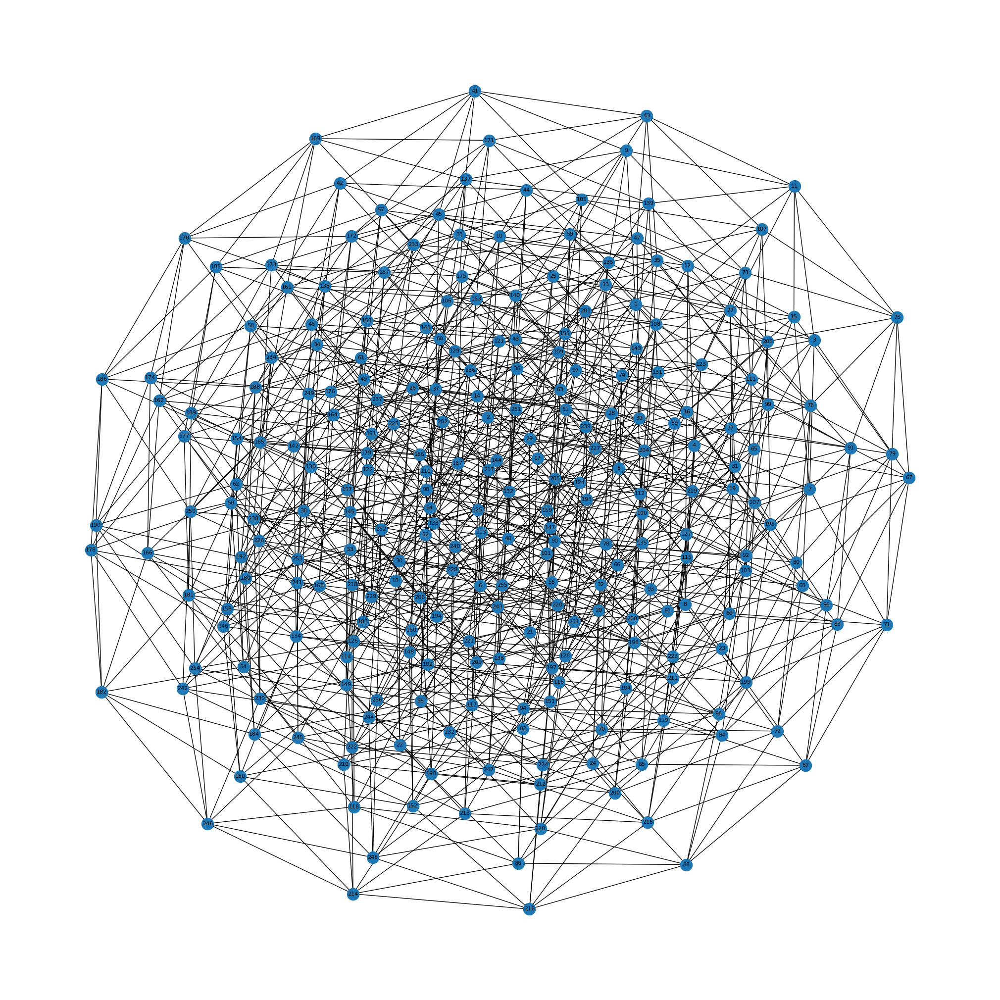

In [63]:


edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))







#  G is the graph object of the

G = nx.Graph()
G.add_edges_from(edges)
pos=nx.spring_layout(G)
plt.figure(1,figsize=(20,20))
nx.draw(G,pos,font_size=8, with_labels=True)





# keys = [n for n in G.nodes()]
# values = patterns
# NODES = {k: v for k, v in zip(keys, values)}



######## each node key is equivalent to a special pattern and its value is the pattern and its energy , for example ; as the patterns vector is a numpy array and starts from 0,we have this : NODES[46] == patterns[45])

NODES = {}
for node , (i,j) in enumerate(patterns):
  # print(i,j,node+1)

  NODES[node+1] = [i,j]




NODE2 = NODES.copy()

NODES




# tHE local minima will be recorded in LM list (definition: the minimum energy among the neighbors) :
LM = []





for node in NODES.keys():

  # # defining the neighbors of node:

  ne =  list(G.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM.append(node)







len(LM)



























print('\n IN LATCHER')


# tHE local minima will be recorded in LM_LATCHER list (definition: the minimum energy among the neighbors) :
LM_LATCHER = []

for node in NODES_LATCHER.keys():

  # # defining the neighbors of node:

  ne =  list(G_LATCHER.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES_LATCHER[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES_LATCHER[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM_LATCHER.append(node)































print('\n IN EXPLORER')
# tHE local minima will be recorded in LM_LATCHER list (definition: the minimum energy among the neighbors) :
LM_EXPLORER = []

for node in NODES_EXPLORER.keys():

  # # defining the neighbors of node:

  ne =  list(G_EXPLORER.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES_EXPLORER[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES_EXPLORER[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM_EXPLORER.append(node)













In [64]:
LM_LATCHER

LM_EXPLORER


LM

[1, 238, 256]

In [65]:
NODES

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[1, 0, 0, 0, 0, 0, 0, 0], 0.6353220162845249],
 3: [[0, 1, 0, 0, 0, 0, 0, 0], 0.6753119954756387],
 4: [[1, 1, 0, 0, 0, 0, 0, 0], 1.3695319115710334],
 5: [[0, 0, 1, 0, 0, 0, 0, 0], 0.5432495757502309],
 6: [[1, 0, 1, 0, 0, 0, 0, 0], 0.9224126131708955],
 7: [[0, 1, 1, 0, 0, 0, 0, 0], 0.8872831200734683],
 8: [[1, 1, 1, 0, 0, 0, 0, 0], 1.325344057305003],
 9: [[0, 0, 0, 1, 0, 0, 0, 0], 0.6652330985598032],
 10: [[1, 0, 0, 1, 0, 0, 0, 0], 1.2373989399713539],
 11: [[0, 1, 0, 1, 0, 0, 0, 0], 0.8091408451820157],
 12: [[1, 1, 0, 1, 0, 0, 0, 0], 1.4402045864044366],
 13: [[0, 0, 1, 1, 0, 0, 0, 0], 1.0007854773376121],
 14: [[1, 0, 1, 1, 0, 0, 0, 0], 1.3167923398853028],
 15: [[0, 1, 1, 1, 0, 0, 0, 0], 0.8134147728074235],
 16: [[1, 1, 1, 1, 0, 0, 0, 0], 1.1883195351659839],
 17: [[0, 0, 0, 0, 1, 0, 0, 0], 0.6342312937693443],
 18: [[1, 0, 0, 0, 1, 0, 0, 0], 0.7237694892469992],
 19: [[0, 1, 0, 0, 1, 0, 0, 0], 0.10907472996486667],
 20: [[1, 1, 0, 

In [279]:
LM

[1, 256]

## Domain size of local minma

In [66]:



#NE is the neighbor members


def search_minimum_energy(NE, threshold):

  e = []

  for l in range(len(NE)):

      e.append(NE[l][1])

  m_ind = e.index(min(e))

  if min(e) < threshold:

    return(NE[m_ind][0])


  # ind = next(idx for idx, val in enumerate(e) if val <= threshold)

  return([])


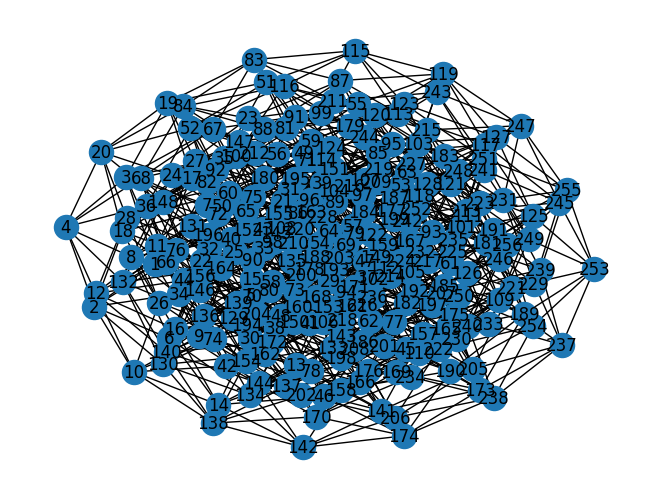

In [67]:
# network construction:

# def edge_list(patterns):

edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))











G = nx.Graph()

G.add_edges_from(edges)

nx.draw(G, with_labels=True)
plt.show()








def basins(G,NODES,ROI):

                label = {}


                for node in range(1,1+ (2**ROI)):



                        ## THE THRESHOLD FOR ENERGY, NOW IS CONSIDERED AS THE ENERGY OF NODE_T

                          node_T = node
                          N = list(G.neighbors(node))
                          # print(N)




                          E_node = NODES[node][1]

                          energies_neighbors = [[n, NODES[n][1]] for n in N]


                          # print(energies_neighbors, E_node)
                          # print(node, 'its node')



                ## T would provide the nodes whose energies are less than current node energy, if there is no node with this condition, then it will be empty:

                          T = search_minimum_energy(energies_neighbors, E_node)




                          print('node, node_T, n, T, energies_neighbors',node, node_T, N, T, energies_neighbors)

                          print(energies_neighbors, 'energies_neighbors')





                          track =[]
                          track.append(node_T)


                          if T != []:
                              N = list(G.neighbors(T))

                              # print(T)


                              # T = node that has energy < E_node


                              while T != []:



                                  track.append(T)


                                  node_T = T
                                  N = list(G.neighbors(node_T))


                                    # print(N)


                                  E_T = NODES[node_T][1]


                                  energies_neighbors = [[n, NODES[n][1]] for n in N]

                                  T = search_minimum_energy(energies_neighbors, E_T)

                                  track.append(T)

                          print(node, track)
                          label[node] = node_T



                return(label)


In [68]:
label = basins(G,NODES,ROI)


label_LATCHER = basins(G_LATCHER , NODES_LATCHER,ROI)


label_EXPLORER = basins(G_EXPLORER , NODES_EXPLORER,ROI)

node, node_T, n, T, energies_neighbors 1 1 [2, 3, 5, 9, 17, 33, 65, 129] [] [[2, 0.6353220162845249], [3, 0.6753119954756387], [5, 0.5432495757502309], [9, 0.6652330985598032], [17, 0.6342312937693443], [33, 0.20589025143070902], [65, 0.4806465055797337], [129, 0.223001137133693]]
[[2, 0.6353220162845249], [3, 0.6753119954756387], [5, 0.5432495757502309], [9, 0.6652330985598032], [17, 0.6342312937693443], [33, 0.20589025143070902], [65, 0.4806465055797337], [129, 0.223001137133693]] energies_neighbors
1 [1]
node, node_T, n, T, energies_neighbors 2 2 [1, 4, 6, 10, 18, 34, 66, 130] 1 [[1, -0.0], [4, 1.3695319115710334], [6, 0.9224126131708955], [10, 1.2373989399713539], [18, 0.7237694892469992], [34, 0.11879746734446961], [66, 0.802744503798219], [130, 0.8591029750973351]]
[[1, -0.0], [4, 1.3695319115710334], [6, 0.9224126131708955], [10, 1.2373989399713539], [18, 0.7237694892469992], [34, 0.11879746734446961], [66, 0.802744503798219], [130, 0.8591029750973351]] energies_neighbors
2 [2, 

In [69]:
set(label.values())

{1, 238, 256}

In [85]:
from collections import Counter

BASIN_SIZE = Counter(list(label.values())) #Counter(L)

for key in BASIN_SIZE.keys():
  # if c[key] >= 1 :
    print(key, 'its basin size is :', BASIN_SIZE[key] , 'its pattern and energy are :', NODES[key] )












BASIN_SIZE_LATCHER = Counter(list(label_LATCHER.values())) #Counter(L)

for key in BASIN_SIZE_LATCHER.keys():
  # if c[key] >= 1 :
    print('LATCHERS',key, 'its basin size is :', BASIN_SIZE_LATCHER[key] , 'its pattern and energy are :', NODES_LATCHER[key] )










BASIN_SIZE_EXPLORER = Counter(list(label_EXPLORER.values())) #Counter(L)

for key in BASIN_SIZE_EXPLORER.keys():
  # if c[key] >= 1 :
    print('EXPLORERS: ', key, 'its basin size is :', BASIN_SIZE_EXPLORER[key] , 'its pattern and energy are :', NODES_EXPLORER[key] )

1 its basin size is : 21 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
256 its basin size is : 162 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], -1.7223508796933658]
238 its basin size is : 73 its pattern and energy are : [[1, 0, 1, 1, 0, 1, 1, 1], -0.8518841859447139]
LATCHERS 1 its basin size is : 47 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
LATCHERS 256 its basin size is : 209 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], -4.2245254475871725]
EXPLORERS:  1 its basin size is : 47 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
EXPLORERS:  256 its basin size is : 209 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], -5.113044916074031]


## Major and Minor local minima

In [86]:
major_local = [256]
minor_local = [1, 238]






major_local_LATCHERS = [256]
minor_local_LATCHERS = [1]





major_local_EXPLORERS = [256]
minor_local_EXPLORERS = [1]











# Random walk simulation

In [71]:
LM

[1, 238, 256]

In [ ]:
# Based on the paper, we have to simulate the random walk for each group initiallized with a random step for 10^5 times.
# What I grassped is that, we should

In [105]:

def Random_walk(G, NODES):

          # initial state :
          init_state = random.choice(list(G.nodes()))
          current_state = init_state
          TIME = 10**5



          trajectory = []

          for time in range(TIME):



              trajectory.append(current_state)


              r = random.uniform(0, 1)



              e_current = NODES[current_state][1]

              neighbors = list(G.neighbors(current_state))




              p = np.array([ min(1, (np.exp(NODES[current_state][1] - (NODES[e][1])))) for e in neighbors ] )


              normalterm = np.sum(np.array([ min(1, (np.exp(NODES[current_state][1] - (NODES[e][1])))) for e in list(G.neighbors(current_state))] ))


              p = p/normalterm

              # print(p)


              new_state = np.random.choice(list(G.neighbors(current_state)), p = p)


              P = p[np.argmax(p)]



              # BASED on MCMC method, we accept just the new state with probability of p:



              if r <= P:

                current_state = new_state





          #### now remove the first 100 step of the trajectory vector since they are trying to keep the system in a good manner :


          trajectory = trajectory[100:]

          return(trajectory)




In [106]:
LM

[1, 238, 256]

In [109]:


def transition_frequency(G,NODES, LM):

            from collections import Counter, defaultdict

            trajectory = Random_walk(G,NODES)


            # List of special states to track
            special_states = LM

            # Compute frequency of major local minima
            state_counter = Counter([x for x in trajectory if x in special_states])

            # Track transitions before and after each special state
            transitions = defaultdict(list)

            for i, state in enumerate(trajectory):
                if state in special_states:
                    # Capture the before and after states if they exist
                    before = trajectory[i-1] if i > 0 else None
                    after = trajectory[i+1] if i < len(trajectory) - 1 else None
                    transitions[state].append((before, after))


            print("Frequency of special states:", state_counter)
            print("Transitions around special states:")
            for state, trans in transitions.items():
                print(f"State {state}: {trans}")








            sorted_frequent_transitions = {}

            for state, trans_list in transitions.items():
                # Count the frequency of each (before, after) tuple
                transition_counter = Counter(trans_list)
                # Get all transitions sorted by frequency
                sorted_transitions = transition_counter.most_common()
                sorted_frequent_transitions[state] = sorted_transitions

            print("Sorted frequency of transitions for each special state:")
            for state, sorted_trans in sorted_frequent_transitions.items():
                print(f"\nState {state}:")
                for trans_tuple, frequency in sorted_trans:
                    print(f"  Transition {trans_tuple}: occurred {frequency} times")





            return(sorted_frequent_transitions, trajectory)



In [110]:
sorted_frequent_transitions, trajectory = transition_frequency(G, NODES, LM)

Frequency of special states: Counter({256: 1421, 238: 868, 1: 366})
Transitions around special states:
State 238: [(None, 238), (238, 238), (238, 238), (238, 174), (240, 238), (238, 238), (238, 238), (238, 240), (240, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 234), (240, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 240), (174, 238), (238, 206), (234, 230), (230, 240), (254, 238), (238, 234), (230, 238), (238, 240), (174, 238), (238, 238), (238, 237), (110, 240), (174, 238), (238, 174), (240, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 240), (254, 234), (254, 238), (238, 238), (238, 238), (238, 238), (238, 238), (238, 254), (254, 254), (254, 238), (238, 238), (238, 238), (238, 240), (240, 238), (238, 23

In [111]:
sorted_frequent_transitions_LATCHER, trajectory_LATCHER = transition_frequency(G_LATCHER, NODES_LATCHER, LM_LATCHER)




Frequency of special states: Counter({256: 13331, 1: 597})
Transitions around special states:
State 256: [(254, 256), (256, 256), (256, 256), (256, 252), (254, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 128), (128, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 252), (192, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 192), (192, 128), (128, 256), (256, 256), (256, 256), (256, 256), (256, 224), (224, 192), (224, 256), (256, 256), (256, 248), (224, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 252), (252, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 128), (128, 256), (256, 256), (256, 254), (192, 256), (256, 224), (224, 256), (256, 256), (256, 256), (256, 224), (224, 256), (256, 256), (256, 256), (256, 256), (256, 224), (128, 256), (256, 224), (192, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 

In [113]:
sorted_frequent_transitions_EXPLORER, trajectory_EXPLORER = transition_frequency(G_EXPLORER, NODES_EXPLORER, LM_EXPLORER)


Frequency of special states: Counter({256: 24964, 1: 709})
Transitions around special states:
State 256: [(248, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 248), (248, 256), (256, 256), (256, 256), (256, 256), (256, 128), (128, 256), (256, 256), (256, 256), (256, 256), (256, 254), (254, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 252), (254, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 128), (128, 256), (256, 256), (256, 192), (192, 256), (256, 256), (256, 128), (128, 255), (255, 256), (256, 255), (255, 256), (256, 256), (256, 256), (256, 256), (256, 240), (240, 256), (256, 256), (256, 256), (256, 224), (224, 256), (256, 240), (240, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 192), (192, 256), (256, 